<a href="https://colab.research.google.com/github/FaruqAlfa/PCVK-Pengolahan-Citra-Visi-Komputer-/blob/main/Week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Jobsheet 5**
### Nama: Mukhamad Faruq Al Fahmi
### Kelas: 3D
### Nim: 2141720066
### Absen: 25


# **Tugas Praktikum**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np


 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


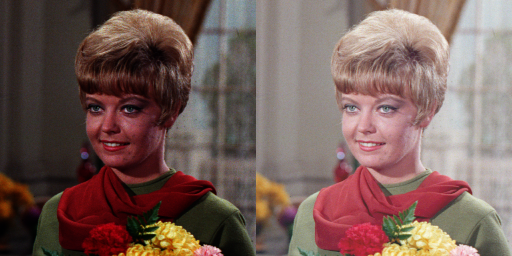

In [ ]:
#1. Buat Gamma Correction sesuai dengan petunjuk berikut

print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
 gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
 print('Error, not a number')


 # Baca gambar (ganti 'path_to_your_image.jpg' dengan path gambar Anda)
original_path = '/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/female.tiff'
original = cv.imread(original_path)

if original is None:
    print(f'File not found: {original_path}')
    exit()

# Normalisasi nilai piksel menjadi rentang [0, 1]
normalized_original = original / 255.0

# Aplikasikan gamma correction
gamma_img = np.zeros_like(original, dtype=np.uint8)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            gamma_img[y, x, c] = np.clip(255 * pow((normalized_original[y, x, c]), (1 / gamma)), 0, 255)

# Gabungkan gambar asli dan hasil gamma correction
final_frame = np.hstack((original, gamma_img))

# Tampilkan gambar
cv2_imshow(final_frame)

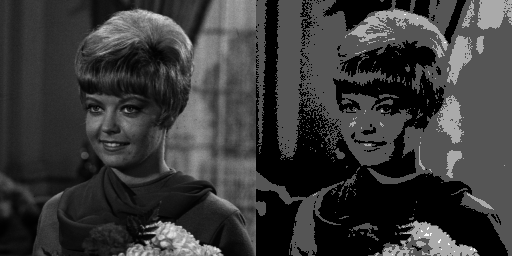

In [ ]:
#2. Buat Simulasi Image Depth
bit_depth = 2
level = 255 / (pow(2, bit_depth) - 1)
original = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/female.tiff', cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    depth_image[y, x] = np.clip(round(original[y, x] / level) * level, 0, 255)

# Note:
# round(img / lvl), bukan round(img / lvl * lvl)

final_frame = cv.hconcat((original, depth_image))
cv2_imshow(final_frame)

In [ ]:
# 3. Buat modul Average Denoising
import glob

cv_img = [5]
for img in glob.glob('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/noises/*.jpg'):
 n= cv.imread(img)
 cv_img.append(n)


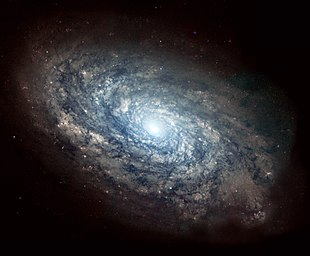

In [ ]:
# Membaca citra asli
img_galaxy = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/galaxy.jpg')
original_galaxy= cv.cvtColor(img_galaxy,cv.COLOR_BGR2RGB) # konversi channel BGR -> RGB
cv2_imshow(original_galaxy)



Nilai PSNR adalah 27.538914932660326 (dB)


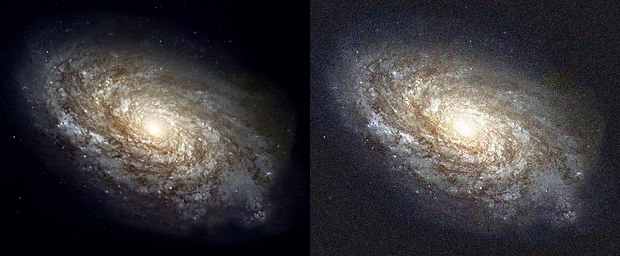

In [ ]:
#No 3.1 (citra: 5)

import glob
from math import log10, sqrt

original = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/galaxy.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

dst = cv_img[0]
noise_number = 4 # nomor (array) gambar pada folder noises
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal.
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.56301346352562 (dB)


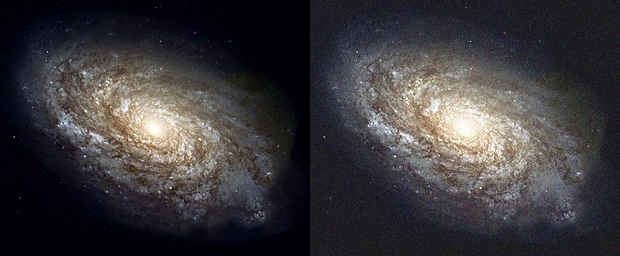

In [ ]:
#No 3.1 (citra: 10)

import glob
from math import log10, sqrt

original = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/galaxy.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

dst = cv_img[0]
noise_number = 10 # nomor (array) gambar pada folder noises
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal.
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.541430453380265 (dB)


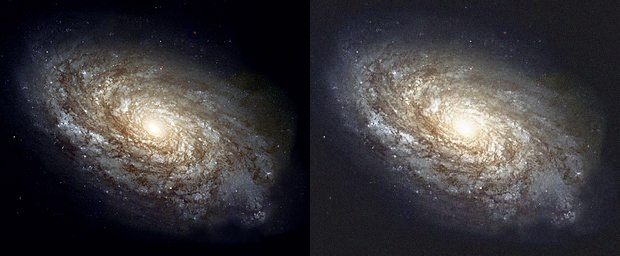

In [ ]:
#No 3.1 (citra: 20)

import glob
from math import log10, sqrt

original = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/galaxy.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

dst = cv_img[0]
noise_number = 20 # nomor (array) gambar pada folder noises
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal.
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.502631324498466 (dB)


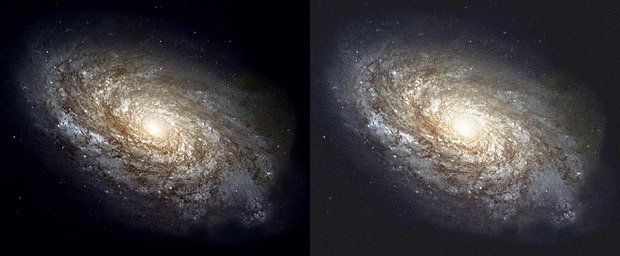

In [ ]:
#No 3.1 (citra: 40)

import glob
from math import log10, sqrt

original = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/galaxy.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

dst = cv_img[0]
noise_number = 40 # nomor (array) gambar pada folder noises
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal.
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.507382993518018 (dB)


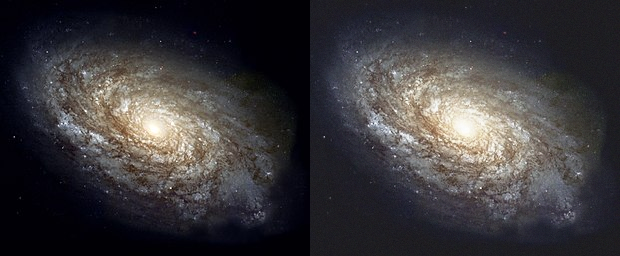

In [ ]:
#No 3.1 (citra: 80)

import glob
from math import log10, sqrt

original = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/galaxy.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

dst = cv_img[0]
noise_number = 80 # nomor (array) gambar pada folder noises
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal.
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah 27.514920732489017 (dB)


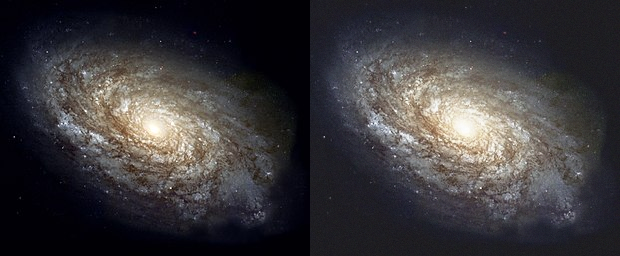

In [ ]:
#No 3.1 (citra: 5)

import glob
from math import log10, sqrt

original = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/galaxy.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

dst = cv_img[0]
noise_number = 100 # nomor (array) gambar pada folder noises
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal.
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

**Kesimpulan:**

Semakin banyak jumlah citra yang dirata-rata maka nilai PNSRnya akan menjadi lebih besar, dan membuat noise pada citra menjadi semakin sedikit.
Sedangkan nilai PSNR yang rendah menunjukkan bahwa gambar yang disambung memiliki kualitas yang buruk, masih terdapat beberapa piksel yang membuat gambar terlihat kasar dan memiliki perbedaan yang signifikan dengan aslinya.

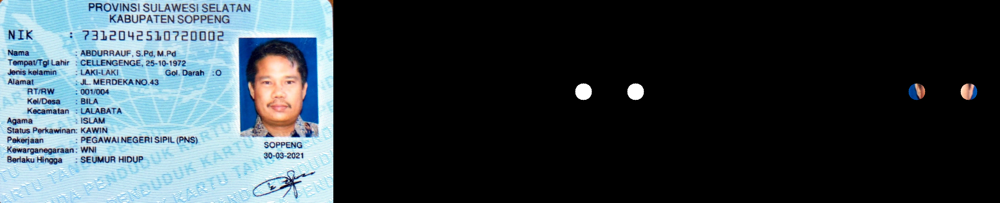

In [96]:
from google.colab.patches import cv2_imshow
image_path = '/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/KTP.png'
original_image = cv.imread(image_path)

center1 = (600, 220)
radius1 = 20
center2 = (725, 220)
radius2 = 20

mask = np.zeros_like(original_image)
cv.circle(mask, center1, radius1, (255, 255, 255), -1)
cv.circle(mask, center2, radius2, (255, 255, 255), -1)

masked_image = cv.bitwise_and(original_image, mask)

final_frame = cv.hconcat((original_image, mask,masked_image))
cv2_imshow(final_frame)

5. Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini

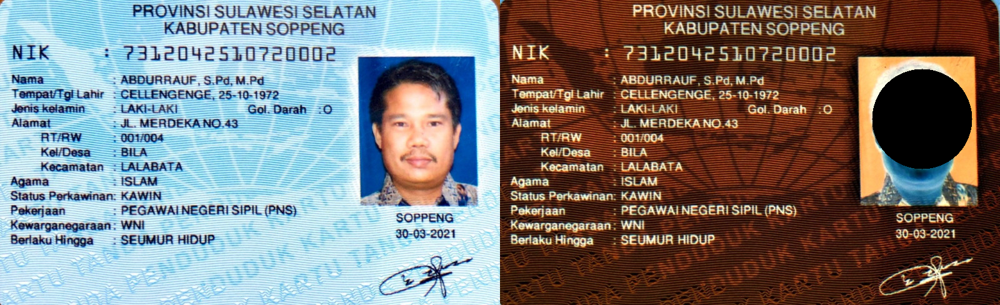

In [112]:
#NOT
img_org = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/KTP.png')

mask = np.zeros(img_org.shape, dtype=np.uint8)
mask = cv.circle(mask, (675,190), 80, (255,255,255), -1)

result = ~img_org & ~mask

org_frame = cv.hconcat((img_org, result))
cv2_imshow(org_frame)

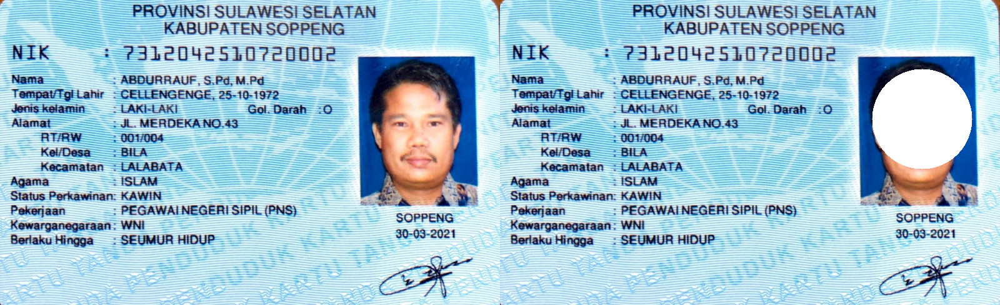

In [113]:
#OR
img_org = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/KTP.png')
mask = np.zeros(img_org.shape, dtype=np.uint8)
mask = cv.circle(mask, (675,190), 80, (255,255,255), -1)

result = img_org | mask

org_frame = cv.hconcat((img_org, result))
cv2_imshow(org_frame)

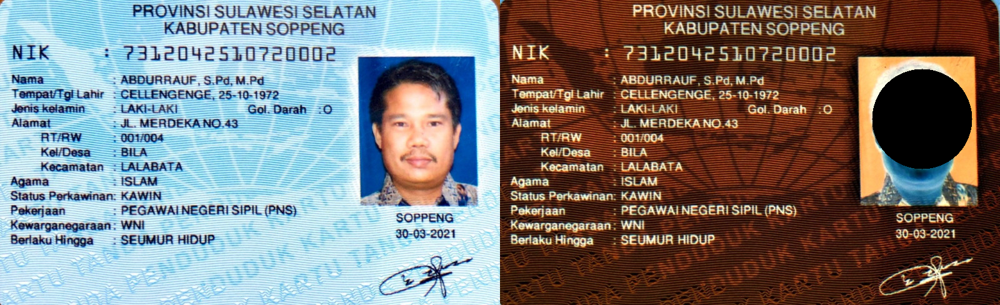

In [114]:
#NOT
img_org = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/KTP.png')
mask = np.zeros(img_org.shape, dtype=np.uint8)
mask = cv.circle(mask, (675,190), 80, (255,255,255), -1)

result = ~img_org & ~mask

org_frame = cv.hconcat((img_org, result))
cv2_imshow(org_frame)

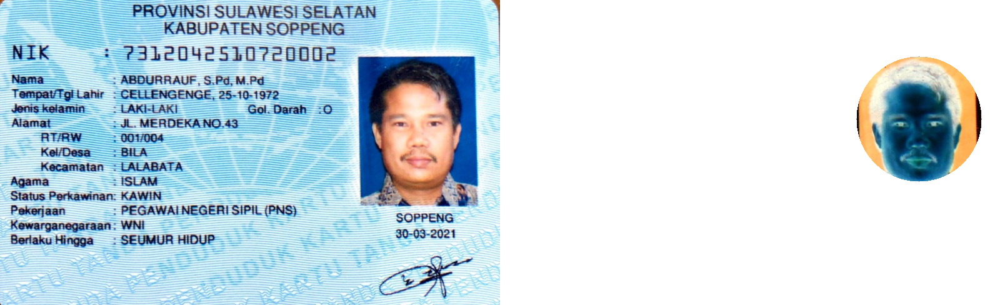

In [117]:
#NAND
img_org = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/KTP.png')
mask = np.zeros(img_org.shape, dtype=np.uint8)
mask = cv.circle(mask, (670,190), 100, (255,255,255), -1)

result = cv.bitwise_not(cv.bitwise_and(img_org, mask))

org_frame = cv.hconcat((img_org, result))
cv2_imshow(org_frame)

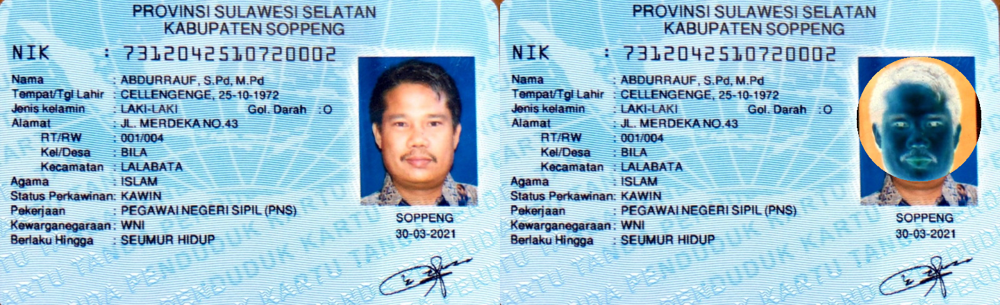

In [118]:
#XOR
img_org = cv.imread('/content/drive/MyDrive/Semester 5/Pengolahan  Citra Visi Komputer/Jobsheet 5/KTP.png')
mask = np.zeros(img_org.shape, dtype=np.uint8)
mask = cv.circle(mask, (670,190), 100, (255,255,255), -1)

result = cv.bitwise_xor(img_org, mask)

org_frame = cv.hconcat((img_org, result))
cv2_imshow(org_frame)